In [1]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
%matplotlib inline

import seaborn as sns
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

from skimage.exposure import rescale_intensity
import argparse

## 读取 显示

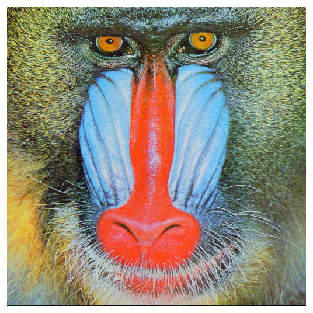

In [2]:
image = cv2.imread('data/baboon.jpg')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.xticks([])
plt.yticks([])
plt.show()
#cv2.imshow('image', image)
#cv2.waitKey(0)
#cv2.destroyAllWindows()

In [3]:
# 行, 列, channel
print(image.shape)

(512, 512, 3)


In [4]:
# uint 8 
type(image[1,1,1])

numpy.uint8

In [5]:
# 查看某行或列的值
# 行 image[1, :, 1] 
# 列 image[:, 1, 1] 

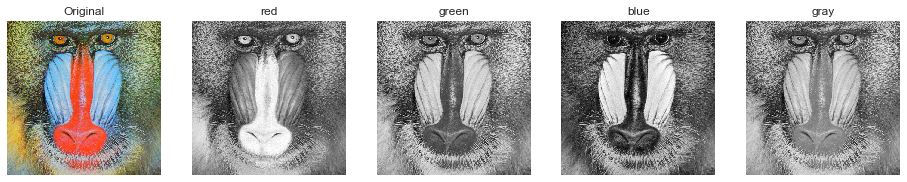

In [8]:
img_red = image[:,:,2]
img_blue = image[:, :, 0]
img_green = image[:, :, 1]

plt.figure(figsize=(16, 8))
plt.subplot(151)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original'),plt.xticks([]), plt.yticks([])

plt.subplot(152)
plt.imshow(img_red, cmap='gray')
plt.title('red'), plt.xticks([]), plt.yticks([])

plt.subplot(153)
plt.imshow(img_green, cmap='gray')
plt.title('green'), plt.xticks([]), plt.yticks([])

plt.subplot(154)
plt.imshow(img_blue, cmap='gray')
plt.title('blue'), plt.xticks([]), plt.yticks([])

plt.subplot(155)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY), cmap='gray')
plt.title('gray'),plt.xticks([]), plt.yticks([])

plt.show()

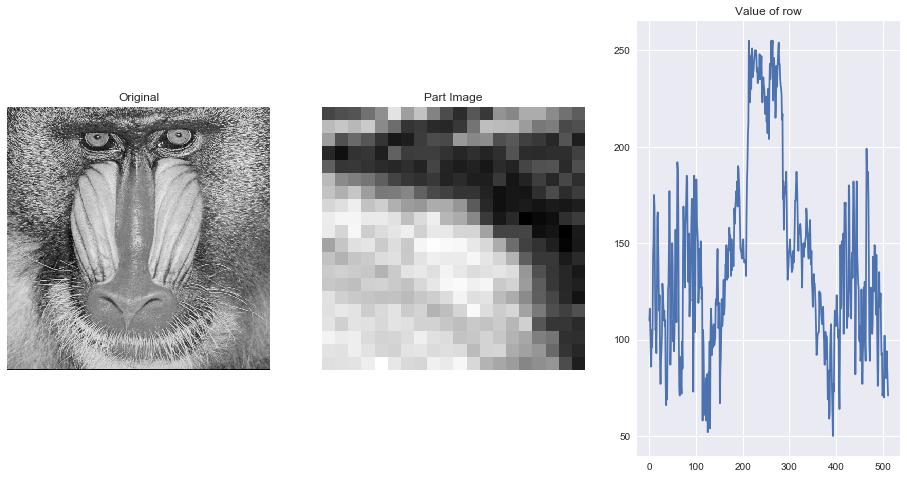

In [9]:
part_image = image[100: 120, 200: 220, :]

plt.figure(figsize=(16, 8))
plt.subplot(131)
plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2GRAY), cmap='gray')
plt.title('Original'),plt.xticks([]), plt.yticks([])

plt.subplot(132)
plt.imshow(cv2.cvtColor(part_image,cv2.COLOR_BGR2GRAY), cmap='gray')
plt.title('Part Image'),plt.xticks([]), plt.yticks([])

plt.subplot(133)
plt.plot(img_red[200,:])
plt.title('Value of row')

plt.show()

In [10]:
# 3D 显示红色图层
data = [
    go.Surface(
        z=img_red,
        colorscale='Greys'
    )
]
layout = go.Layout(
    title='Red Layer',
    autosize=False,
    width=500,
    height=500,
    margin=dict(
        l=65,
        r=50,
        b=65,
        t=90
    )
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='red_layer')

In [11]:
# 3D 显示蓝色层
data = [
    go.Surface(
        z=img_blue,
        colorscale='Greys'
    )
]
layout = go.Layout(
    title='Blue Layer',
    autosize=False,
    width=500,
    height=500,
    margin=dict(
        l=65,
        r=50,
        b=65,
        t=90
    )
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='blue_layer')

## Cross-Correlation

\\[G[i, j] = \sum_{u=-k}^{k}\sum_{v=-k}^{k}h[u,v]F[i+u,j+v]\\]

## Convolution

\\[G[i, j] = \sum_{u=-k}^{k}\sum_{v=-k}^{k}h[u,v]F[i-u,j-v]\\]

## Filter 的展示

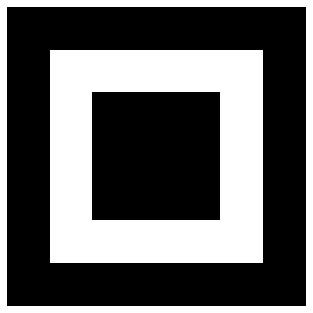

In [12]:
# 先用数字画个图片
rect = [[0,0,0,0,0,0,0],
           [0,255,255,255,255,255,0],
           [0,255,0,0,0,255,0],
           [0,255,0,0,0,255,0],
           [0,255,0,0,0,255,0],
           [0,255,255,255,255,255,0],
           [0,0,0,0,0,0,0]]
rect = np.array(rect)
              
plt.imshow(rect, cmap='gray')
plt.xticks([]), plt.yticks([])
plt.show()

In [13]:
# 定义一个方法来做 Cross-correlation
def apply_filter(source, kernel):
    width, height = source.shape
    k_w, k_h = kernel.shape
    g = np.zeros(source.shape)
    for i in range(width):
        for j in range(height):
            for u in range(k_w):
                for v in range(k_h):
                    if (i + u ) < width and (j + v) < height:
                        g[i, j] += kernel[u, v] * source[i + u, j + v]
                        
    return g

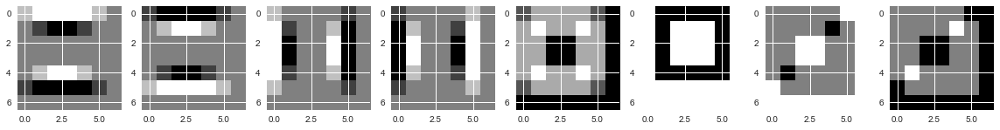

In [14]:
# 定义几种 filter 
k = [
    [[-1,-1],
      [1,1]],
    [[1,1],
      [-1,-1]],
    [[-1,1],
     [-1,1]],
    [[1,-1],
     [1,-1]],
    [[1/4,1/4],
     [1/4,1/4]],
    [[0,0],
     [-1,0]],
    [[-1,0],
     [0,-1]],
    [[1,0],
     [0,1]]
    ]
k = np.array(k)
fig = plt.figure(figsize=(20,20))
# 展示出来经过各个 filter 做了 cross-correlation 的效果
for idx,kernel in enumerate(k):
    plt.subplot(1, len(k), idx + 1)
    kernel = np.array(kernel)
    output = apply_filter(rect, kernel)
    plt.imshow(output, cmap='gray')
    
plt.show()

## 如果觉得还不够直观? 那我们优化一下

* 加入 padding 的概念, 否则我们的图片随着 kernel 大小会缩水...
* 减少两个循环, 否则我们用的是图片的话, 多两个循环算起来太久.

In [15]:
def convolve(image, kernel):
    # 拿到图片的空间数值
    (iH, iW) = image.shape[:2]
    # 拿到 kernel 的空间数值
    (kH, kW) = kernel.shape[:2]
 
    # 计算 pad 
    pad = int((kW - 1) / 2)
    # 给需要输入图片加 border, 保证输出结果大小与原图相同
    # 这里使用 replicate 的方式
    image = cv2.copyMakeBorder(image, pad, pad, pad, pad, 
                               cv2.BORDER_REPLICATE)
    output = np.zeros((iH, iW), dtype="float32")
    
    # 扫描每个 input image 上的点.
    # 这里不从0开始, 是因为pad 是我们添加上的.
    for y in np.arange(pad, iH + pad):
        for x in np.arange(pad, iW + pad):
            # 拿到每个需要的区域
            roi = image[y - pad: y + pad + 1, x - pad : x + pad + 1]
            # 计算
            k = (roi * kernel).sum()
            # 把结果放在 output 的对应点上
            output[y - pad, x - pad] = k
    # 将 output 缩放到[0, 255] 这个区间上
    output = rescale_intensity(output, in_range=(0, 255))
    output = (output * 255).astype("uint8")
    
    return output

## 定义一些常用的 kernel

In [16]:
blur_one = np.ones((7, 7), dtype="float") * (1.0 / (7 * 7))
blue_two = np.ones((21, 21), dtype="float") * (1.0 / (21 * 21))

sharpen = np.array((
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]), dtype="int")

laplacian = np.array((
    [0, 1, 0],
    [1, -4, 1],
    [0, 1, 0]), dtype="int")

sobelX = np.array((
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]), dtype="int")

sobelY = np.array((
    [-1, -2, -1],
    [0, 0, 0],
    [1, 2, 1]), dtype="int")

## CV 处理最喜爱的 Lena 登场演示

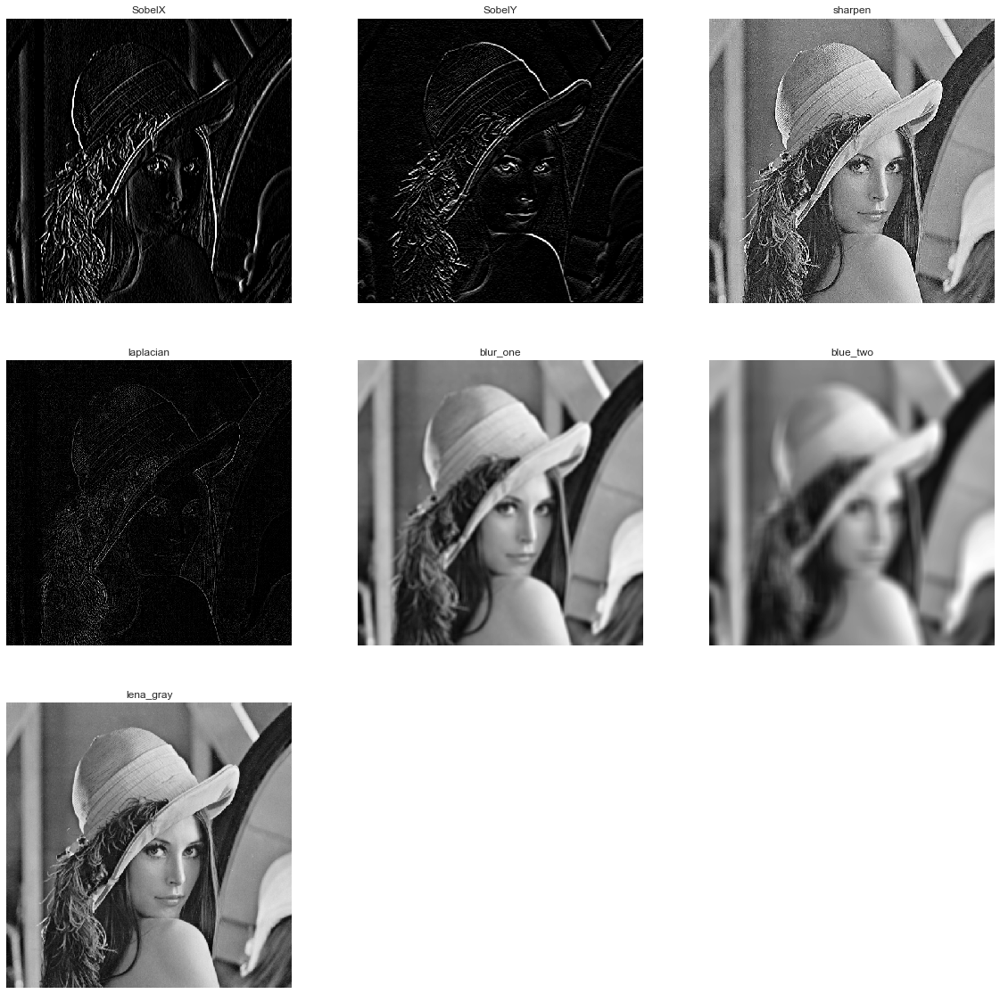

In [17]:
lena = cv2.imread('data/lena.jpg')
lena_gray = cv2.cvtColor(lena, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(20, 20))
plt.subplot(3, 3, 1)
convolveOutput = convolve(lena_gray, sobelX)
plt.imshow(convolveOutput, cmap='gray')
plt.xticks([]),plt.yticks([]),plt.title('SobelX')

plt.subplot(3, 3, 2)
convolveOutput = convolve(lena_gray, sobelY)
plt.imshow(convolveOutput, cmap='gray')
plt.xticks([]),plt.yticks([]),plt.title('SobelY')

plt.subplot(3, 3, 3)
convolveOutput = convolve(lena_gray, sharpen)
plt.imshow(convolveOutput, cmap='gray')
plt.xticks([]),plt.yticks([]),plt.title('sharpen')

plt.subplot(3, 3, 4)
convolveOutput = convolve(lena_gray, laplacian)
plt.imshow(convolveOutput, cmap='gray')
plt.xticks([]),plt.yticks([]),plt.title('laplacian')

plt.subplot(3, 3, 5)
convolveOutput = convolve(lena_gray, blur_one)
plt.imshow(convolveOutput, cmap='gray')
plt.xticks([]),plt.yticks([]),plt.title('blur_one')

plt.subplot(3, 3, 6)
convolveOutput = convolve(lena_gray, blue_two)
plt.imshow(convolveOutput, cmap='gray')
plt.xticks([]),plt.yticks([]),plt.title('blue_two')

plt.subplot(3, 3, 7)
plt.imshow(lena_gray, cmap='gray')
plt.xticks([]),plt.yticks([]),plt.title('lena_gray')

plt.show()


## 简化一下, 我们来在简单的图形上(八边形) 更直观的看看

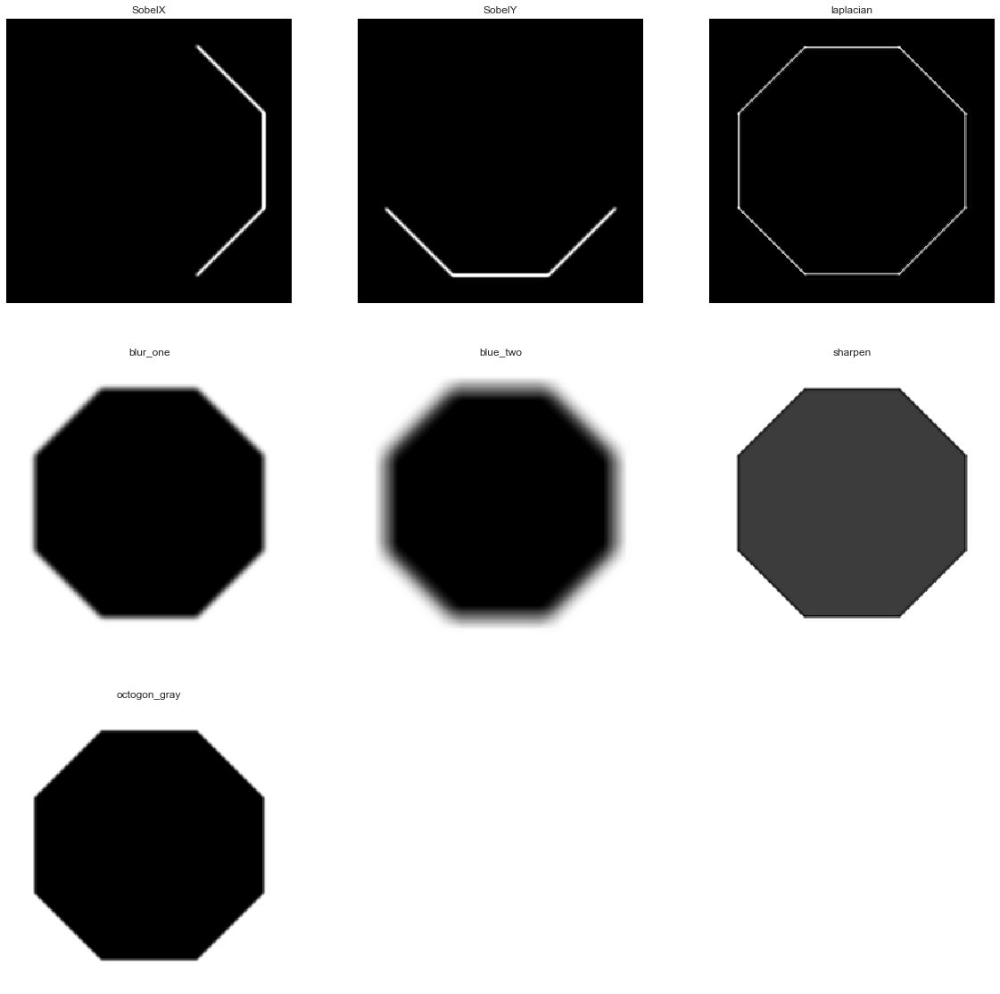

In [18]:
octogon = cv2.imread('data/octogon.png')
octogon_gray = cv2.cvtColor(octogon, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(20, 20))
plt.subplot(3, 3, 1)
convolveOutput = convolve(octogon_gray, sobelX)
plt.imshow(convolveOutput, cmap='gray')
plt.xticks([]),plt.yticks([]),plt.title('SobelX')

plt.subplot(3, 3, 2)
convolveOutput = convolve(octogon_gray, sobelY)
plt.imshow(convolveOutput, cmap='gray')
plt.xticks([]),plt.yticks([]),plt.title('SobelY')

plt.subplot(3, 3, 3)
convolveOutput = convolve(octogon_gray, laplacian)
plt.imshow(convolveOutput, cmap='gray')
plt.xticks([]),plt.yticks([]),plt.title('laplacian')

plt.subplot(3, 3, 4)
convolveOutput = convolve(octogon_gray, blur_one)
plt.imshow(convolveOutput, cmap='gray')
plt.xticks([]),plt.yticks([]),plt.title('blur_one')

plt.subplot(3, 3, 5)
blur_img = convolve(octogon_gray, blue_two)
plt.imshow(blur_img, cmap='gray')
plt.xticks([]),plt.yticks([]),plt.title('blue_two')


plt.subplot(3, 3, 6)
convolveOutput = convolve(octogon_gray, sharpen)
plt.imshow(convolveOutput, cmap='gray')
plt.xticks([]),plt.yticks([]),plt.title('sharpen')

plt.subplot(3, 3, 7)
plt.imshow(octogon_gray, cmap='gray')
plt.xticks([]),plt.yticks([]),plt.title('octogon_gray')

plt.show()


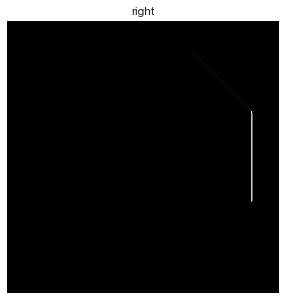

In [19]:
right = np.array((
    [-1, 0, 1],
    [-1, 0, 1],
    [-1, 0, 0]), dtype="int")

plt.figure(figsize=(5, 5))
convolveOutput = convolve(octogon_gray, right)
plt.imshow(convolveOutput, cmap='gray')
plt.xticks([]),plt.yticks([]),plt.title('right')

plt.show()

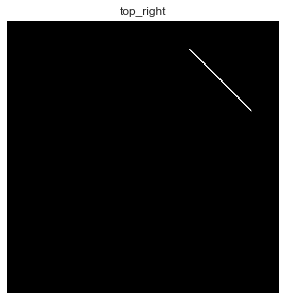

In [20]:
top_right = np.array((
    [0, 1, 1],
    [-1, 0, 0],
    [-1, -1, 0]), dtype="int")

plt.figure(figsize=(5, 5))
convolveOutput = convolve(octogon_gray, top_right)
plt.imshow(convolveOutput, cmap='gray')
plt.xticks([]),plt.yticks([]),plt.title('top_right')

plt.show()

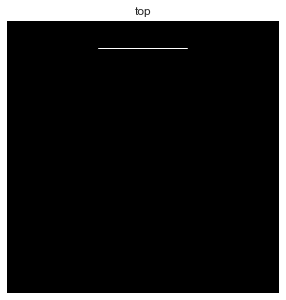

In [21]:
top = np.array((
    [1, 1, 0],
    [0, 0, 0],
    [-1, -1, -1]), dtype="int")

plt.figure(figsize=(5, 5))
convolveOutput = convolve(octogon_gray, top)
plt.imshow(convolveOutput, cmap='gray')
plt.xticks([]),plt.yticks([]),plt.title('top')

plt.show()

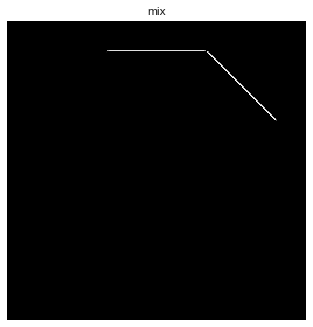

In [24]:
top_right_out = convolve(octogon_gray, top_right)
top_out = convolve(octogon_gray, top)

mix = top_right_out + top_out
plt.imshow(mix, cmap='gray')
plt.xticks([]),plt.yticks([]),plt.title('mix')

plt.show()

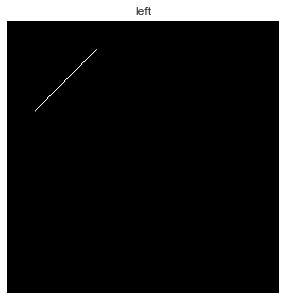

In [29]:
left = np.array((
    [1, 0, 0],
    [1, 0, -1],
    [0, -1, -1]), dtype="int")

plt.figure(figsize=(5, 5))
left_output = convolve(octogon_gray, left)
plt.imshow(left_output, cmap='gray')
plt.xticks([]),plt.yticks([]),plt.title('left')

plt.show()

## 抽取 Inception v3 的 filter

In [40]:
import os.path
import tensorflow as tf
from tensorflow.python.platform import gfile
import matplotlib.pyplot as plt

with open('pathdata.txt', 'r') as f:
    log_dir = f.readline()
    model_filename = f.readline()

In [9]:
if not os.path.exists(log_dir):
    os.makedirs(log_dir)

with tf.Session() as sess:
    model_filename = model_filename
    with gfile.FastGFile(model_filename, "rb") as f:
        graph_def = tf.GraphDef()
        graph_def.ParseFromString(f.read())
        _ = tf.import_graph_def(graph_def, name="")

    # Stage A
    filter0_tensor = sess.graph.get_tensor_by_name("conv:0")
    
    # Stage B
    filter2_tensor = sess.graph.get_tensor_by_name("conv_2:0")
    
    # Stage C
    filter_mix2_tensor = sess.graph.get_tensor_by_name("mixed_2/join:0")
    
    # Stagc D
    filter_mix7_tensor = sess.graph.get_tensor_by_name("mixed_7/join:0")

    # bottleneck feature
    feature_tensor = sess.graph.get_tensor_by_name("pool_3:0")

    # query image that going to feed into the inception network
    image_data = gfile.FastGFile("data/android.png", "rb").read()
    
    # feed in the query image and retrieve tensor value at different stages
    filter0, filter2, filter_mix2, filter_mix7, feature = sess.run(
        [filter0_tensor, filter2_tensor, filter_mix2_tensor, filter_mix7_tensor, feature_tensor], {
            "DecodeJpeg/contents:0": image_data
        })

#     filter0 = filter0[0]
#     filter2 = filter2[0]
#     filter_mix2 = filter_mix2[0]
#     filter_mix7 = filter_mix7[0]
#     feature = feature[0][0][0]

    # uncomment for ploting feature at stage A, B, C and D
#     fig, axes = plt.subplots(4, 8, sharex=True, sharey=True)
#     for y in range(4):
#         for x in range(8):
#             axes[y][x].axis("off")
#             axes[y][x].imshow(filter0[:, :, y * 8 + x], cmap=plt.cm.gray)
#             axes[y][x].set_adjustable('box-forced')
#     plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)
#     fig, axes = plt.subplots(4, 8, sharex=True, sharey=True)
#     for y in range(4):
#         for x in range(8):
#             axes[y][x].axis("off")
#             axes[y][x].imshow(filter2[:, :, y * 8 + x], cmap=plt.cm.gray)
#             axes[y][x].set_adjustable('box-forced')
#     plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)
#     fig, axes = plt.subplots(16, 18, sharex=True, sharey=True)
#     for y in range(16):
#         for x in range(18):
#             axes[y][x].axis("off")
#             axes[y][x].imshow(filter_mix2[:, :, y * 18 + x], cmap=plt.cm.gray)
#             axes[y][x].set_adjustable('box-forced')
#     plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)
#     fig, axes = plt.subplots(24, 32, sharex=True, sharey=True)
#     for y in range(24):
#         for x in range(32):
#             axes[y][x].axis("off")
#             axes[y][x].imshow(filter_mix7[:, :, y * 32 + x], cmap=plt.cm.gray)
#             axes[y][x].set_adjustable('box-forced')
#     plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)
    
    # plot the bottleneck feature
    print(feature.shape)
#     plt.bar(range(2048), feature, width=3, color="blue", linewidth=0)
#     plt.xlim(xmax=2048)
    plt.show()

(1, 1, 1, 2048)


## Conv 第一层 filter 后的图片

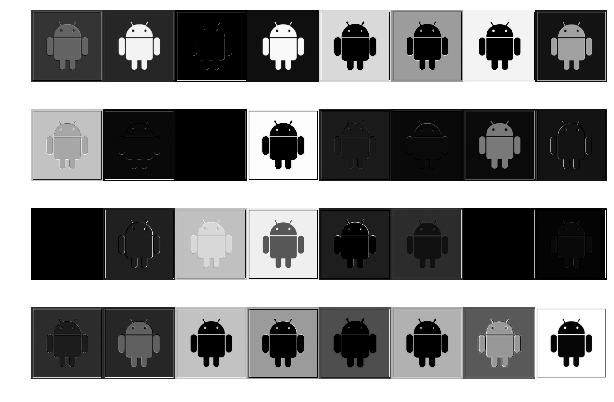

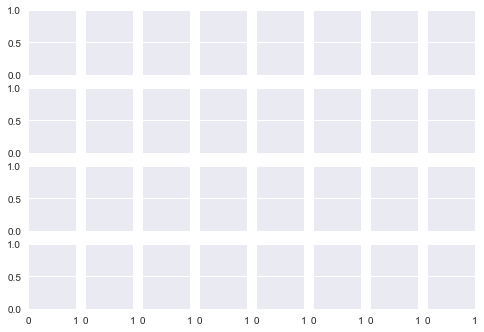

In [15]:
fig, axes = plt.subplots(4, 8, sharex=True, sharey=True)
fig, axes = plt.subplots(4, 8, sharex=True, sharey=True)
for y in range(4):
    for x in range(8):
        axes[y][x].axis("off")
        axes[y][x].imshow(filter0[:, :, y * 8 + x], cmap=plt.cm.gray)
        axes[y][x].set_adjustable('box-forced')
plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)
fig, axes = plt.subplots(4, 8, sharex=True, sharey=True)
plt.show()

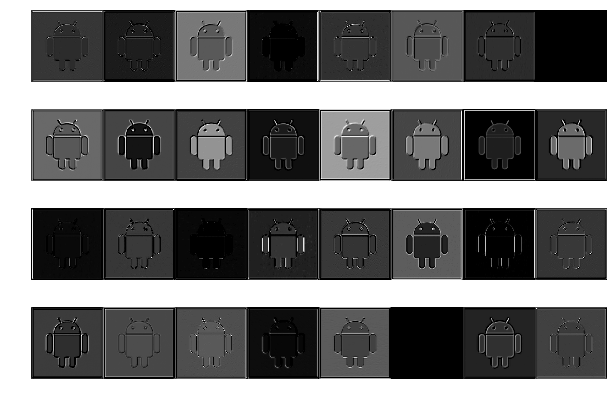

In [16]:
filter2 = filter2[0]
fig, axes = plt.subplots(4, 8, sharex=True, sharey=True)
for y in range(4):
    for x in range(8):
        axes[y][x].axis("off")
        axes[y][x].imshow(filter2[:, :, y * 8 + x], cmap=plt.cm.gray)
        axes[y][x].set_adjustable('box-forced')
plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)
plt.show()

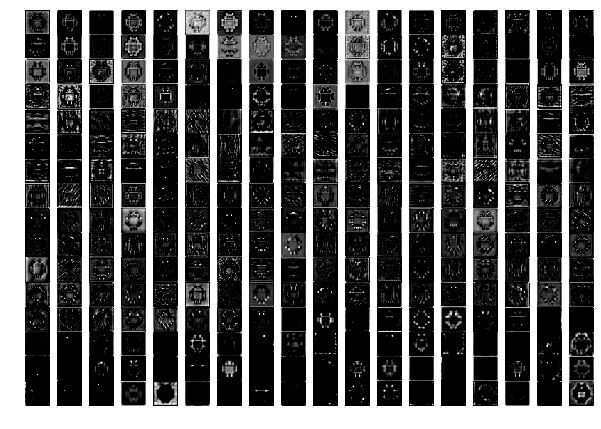

In [17]:
filter_mix2 = filter_mix2[0]
fig, axes = plt.subplots(16, 18, sharex=True, sharey=True)
for y in range(16):
    for x in range(18):
        axes[y][x].axis("off")
        axes[y][x].imshow(filter_mix2[:, :, y * 18 + x], cmap=plt.cm.gray)
        axes[y][x].set_adjustable('box-forced')
plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)
plt.show()

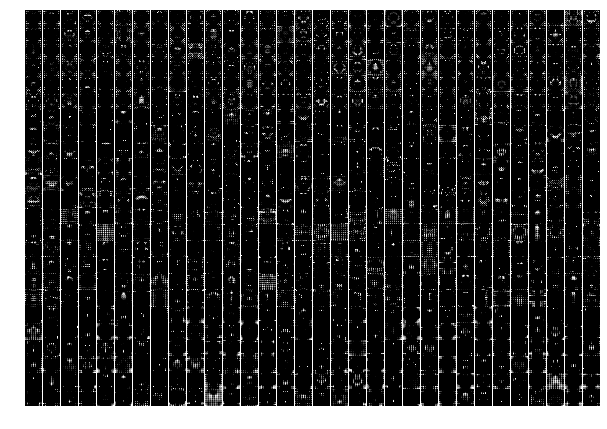

In [18]:
filter_mix7 = filter_mix7[0]
fig, axes = plt.subplots(24, 32, sharex=True, sharey=True)
for y in range(24):
    for x in range(32):
        axes[y][x].axis("off")
        axes[y][x].imshow(filter_mix7[:, :, y * 32 + x], cmap=plt.cm.gray)
        axes[y][x].set_adjustable('box-forced')
plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)
plt.show()

In [21]:

if not os.path.exists(log_dir):
    os.makedirs(log_dir)

with tf.Session() as sess:

    # tensorflow graph model can be downloaded from
    # https://storage.googleapis.com/download.tensorflow.org/models/inception_dec_2015.zip
    model_filename = model_filename
    
    with gfile.FastGFile(model_filename, "rb") as f:
        graph_def = tf.GraphDef()
        graph_def.ParseFromString(f.read())
        _ = tf.import_graph_def(graph_def, name="")
    writer = tf.summary.FileWriter(log_dir, tf.get_default_graph())
    writer.close()